#1.Get New York City Taxi Trip Duration Dataset here (https://www.kaggle.com/competitions/nyc-taxi-trip-duration/data)

In [1]:
!pip install gdown
import pandas as pd
import gdown


In [2]:
!gdown --id 1ASQXv5AuBN44ZBhgt374VY0vfHZaNU1u

!unzip nyc-taxi-trip-duration.zip


/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:132: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1ASQXv5AuBN44ZBhgt374VY0vfHZaNU1u
From (redirected): https://drive.google.com/uc?id=1ASQXv5AuBN44ZBhgt374VY0vfHZaNU1u&confirm=t&uuid=29170443-b6a3-4f7d-842a-de13e40d0c5d
To: /content/nyc-taxi-trip-duration.zip
100% 89.9M/89.9M [00:00<00:00, 206MB/s]
Archive:  nyc-taxi-trip-duration.zip
replace sample_submission.zip? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [3]:
!unzip test.zip
!unzip train.zip
!unzip sample_submission.zip

Archive:  test.zip
replace test.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: Archive:  train.zip
replace train.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: Archive:  sample_submission.zip
replace sample_submission.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

Теперь мы можем работать с разархивированными данными

In [4]:
import pandas as pd

test_df = pd.read_csv('test.csv')
train_df = pd.read_csv('train.csv')
sample_submission= pd.read_csv('sample_submission.csv')

In [5]:
train_df

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,2124
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,429
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,435
...,...,...,...,...,...,...,...,...,...,...,...
1458639,id2376096,2,2016-04-08 13:31:04,2016-04-08 13:44:02,4,-73.982201,40.745522,-73.994911,40.740170,N,778
1458640,id1049543,1,2016-01-10 07:35:15,2016-01-10 07:46:10,1,-74.000946,40.747379,-73.970184,40.796547,N,655
1458641,id2304944,2,2016-04-22 06:57:41,2016-04-22 07:10:25,1,-73.959129,40.768799,-74.004433,40.707371,N,764
1458642,id2714485,1,2016-01-05 15:56:26,2016-01-05 16:02:39,1,-73.982079,40.749062,-73.974632,40.757107,N,373


In [6]:
train_df.isnull().values.sum()

0

In [7]:
train_df.dtypes

id                     object
vendor_id               int64
pickup_datetime        object
dropoff_datetime       object
passenger_count         int64
pickup_longitude      float64
pickup_latitude       float64
dropoff_longitude     float64
dropoff_latitude      float64
store_and_fwd_flag     object
trip_duration           int64
dtype: object

Преобразую значение времени в объект время

In [8]:
train_df['pickup_datetime'] = pd.to_datetime(train_df['pickup_datetime'])
train_df['dropoff_datetime'] = pd.to_datetime(train_df['dropoff_datetime'])


test_df['pickup_datetime'] = pd.to_datetime(test_df['pickup_datetime'])


In [9]:
train_df.dtypes

id                            object
vendor_id                      int64
pickup_datetime       datetime64[ns]
dropoff_datetime      datetime64[ns]
passenger_count                int64
pickup_longitude             float64
pickup_latitude              float64
dropoff_longitude            float64
dropoff_latitude             float64
store_and_fwd_flag            object
trip_duration                  int64
dtype: object

In [10]:
test_df

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag
0,id3004672,1,2016-06-30 23:59:58,1,-73.988129,40.732029,-73.990173,40.756680,N
1,id3505355,1,2016-06-30 23:59:53,1,-73.964203,40.679993,-73.959808,40.655403,N
2,id1217141,1,2016-06-30 23:59:47,1,-73.997437,40.737583,-73.986160,40.729523,N
3,id2150126,2,2016-06-30 23:59:41,1,-73.956070,40.771900,-73.986427,40.730469,N
4,id1598245,1,2016-06-30 23:59:33,1,-73.970215,40.761475,-73.961510,40.755890,N
...,...,...,...,...,...,...,...,...,...
625129,id3008929,1,2016-01-01 00:02:52,1,-74.003464,40.725105,-74.001251,40.733643,N
625130,id3700764,1,2016-01-01 00:01:52,1,-74.006363,40.743782,-73.953407,40.782467,N
625131,id2568735,1,2016-01-01 00:01:24,2,-73.972267,40.759865,-73.876602,40.748665,N
625132,id1384355,1,2016-01-01 00:00:28,1,-73.976501,40.733562,-73.854263,40.891788,N


In [11]:
sample_submission

,id,trip_duration
0,id3004672,959
1,id3505355,959
2,id1217141,959
3,id2150126,959
4,id1598245,959
...,...,...
625129,id3008929,959
625130,id3700764,959
625131,id2568735,959
625132,id1384355,959


In [12]:
print(train_df.columns)
print(test_df.columns)

'''
в test у нас нет 2-х столбоц: dropoff_datetime, trip_duration
'''

Index(['id', 'vendor_id', 'pickup_datetime', 'dropoff_datetime',
       'passenger_count', 'pickup_longitude', 'pickup_latitude',
       'dropoff_longitude', 'dropoff_latitude', 'store_and_fwd_flag',
       'trip_duration'],
      dtype='object')
Index(['id', 'vendor_id', 'pickup_datetime', 'passenger_count',
       'pickup_longitude', 'pickup_latitude', 'dropoff_longitude',
       'dropoff_latitude', 'store_and_fwd_flag'],
      dtype='object')


'\nв test у нас нет 2-х столбоц: dropoff_datetime, trip_duration\n'

#Dataset Description

The competition dataset is based on the 2016 NYC Yellow Cab trip record data made available in Big Query on Google Cloud Platform. The data was originally published by the NYC Taxi and Limousine Commission (TLC). The data was sampled and cleaned for the purposes of this playground competition. Based on individual trip attributes, participants should predict the duration of each trip in the test set.

File descriptions
train.csv - the training set (contains 1458644 trip records)
test.csv - the testing set (contains 625134 trip records)
sample_submission.csv - a sample submission file in the correct format
Data fields
id - a unique identifier for each trip
vendor_id - a code indicating the provider associated with the trip record
pickup_datetime - date and time when the meter was engaged
dropoff_datetime - date and time when the meter was disengaged
passenger_count - the number of passengers in the vehicle (driver entered value)
pickup_longitude - the longitude where the meter was engaged
pickup_latitude - the latitude where the meter was engaged
dropoff_longitude - the longitude where the meter was disengaged
dropoff_latitude - the latitude where the meter was disengaged
store_and_fwd_flag - This flag indicates whether the trip record was held in vehicle memory before sending to the vendor because the vehicle did not have a connection to the server - Y=store and forward; N=not a store and forward trip
trip_duration - duration of the trip in seconds
Disclaimer: The decision was made to not remove dropoff coordinates from the dataset order to provide an expanded set of variables to use in Kernels.

Цель: спрогнозировать продолжительность каждой поездки в тестовом наборе

#Описания файлов

train.csv — обучающий набор (содержит 1458644 записи о поездках)
test.csv — набор для тестирования (содержит 625134 записи о поездках)
sample_submission.csv — образец файла отправки в правильном формате.

#Поля данных

id - уникальный идентификатор каждой поездки

vendor_id — код, указывающий провайдера, связанного с записью о поездке

Pickup_datetime — дата и время включения счетчика

dropoff_datetime — дата и время отключения счетчика

passenger_count- количество пассажиров в транспортном средстве (значение, введенное водителем)

Pickup_longitude — долгота, на которой был задействован счетчик.

Pickup_latitude — широта, на которой был включен счетчик

dropoff_longitude — долгота, на которой счетчик был отключен

dropoff_latitude — широта, на которой счетчик был отключен

store_and_fwd_flag — этот флаг указывает, хранилась ли запись о поездке в памяти автомобиля перед отправкой продавцу, поскольку у автомобиля не было соединения с сервером — Y=сохранить и переслать; N = не поездка в магазин и вперед

trip_duration — продолжительность поездки в секундах


#2.Make EDA.

# Let's split the data test_df

In [13]:
import pandas as pd
from sklearn.model_selection import train_test_split


X = train_df.drop(columns=['dropoff_datetime', 'trip_duration'])
Y = train_df['trip_duration']

# Разделение на обучающий и тестовый наборы данных
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# Создание новых датасетов
train_df_X_train = X_train
train_df_Y_train = Y_train
train_df_X_test = X_test
train_df_Y_test = Y_test

# Вывод размеров новых датасетов
print("X_train shape:", train_df_X_train.shape)
print("Y_train shape:", train_df_Y_train.shape)
print("X_test shape:", train_df_X_test.shape)
print("Y_test shape:", train_df_Y_test.shape)


X_train shape: (1166915, 9)
Y_train shape: (1166915,)
X_test shape: (291729, 9)
Y_test shape: (291729,)


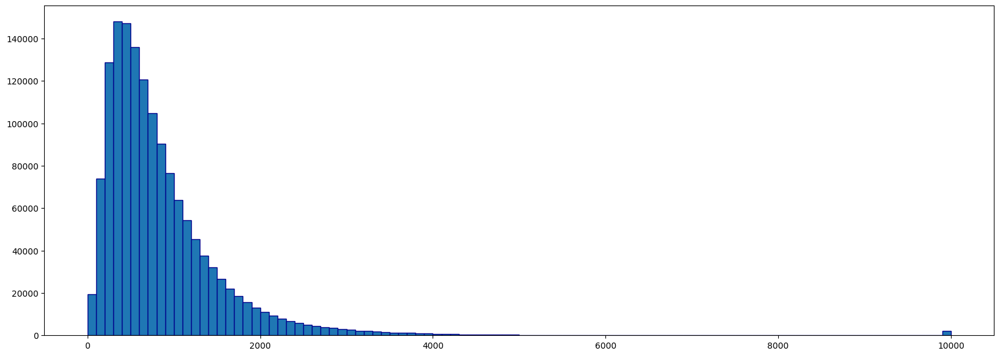

2.7777777777777777


In [14]:
import matplotlib.pyplot as plt


'''
Строит гистограмму значений переменной 'trip_duration'. .clip(None, 10000) используется для
 ограничения значений переменной 'trip_duration' до максимального значения 10000 (это может быть
 сделано для улучшения визуализации,
 удаляя выбросы или необычно длинные поездки).
 bins=100 указывает количество интервалов для гистограммы.

'''
import matplotlib.pyplot as plt


fix, ax = plt.subplots(figsize=(20, 7))
plt.hist(Y.clip(None, 10000), bins=100, edgecolor='darkblue')
plt.show()

#вычисление количества часов в 10000 секундах
print(10000 / 60 / 60)




##For a comprehensive analysis, I will take into account the month, time and day of the week separately

In [15]:
new_df_for_time = pd.DataFrame()
new_df_for_time['day_of_week'] = X['pickup_datetime'].dt.dayofweek
new_df_for_time['hour_of_day'] = X['pickup_datetime'].dt.hour
new_df_for_time['month'] = X['pickup_datetime'].dt.month

In [16]:
new_df_for_time

,day_of_week,hour_of_day,month
0,0,17,3
1,6,0,6
2,1,11,1
3,2,19,4
4,5,13,3
...,...,...,...
1458639,4,13,4
1458640,6,7,1
1458641,4,6,4
1458642,1,15,1


In [17]:
unique_months = new_df_for_time['month'].unique()
unique_months.sort()
print(unique_months)

[1 2 3 4 5 6]


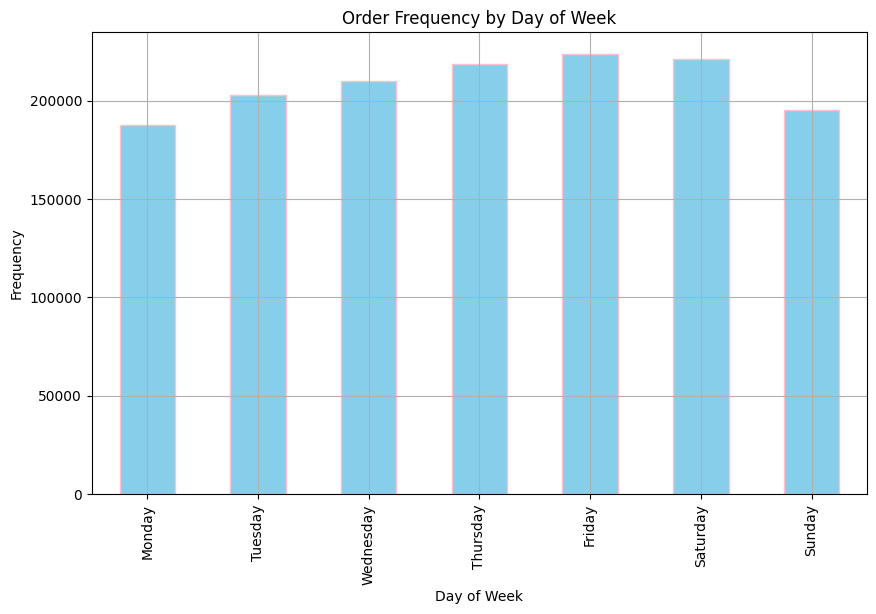

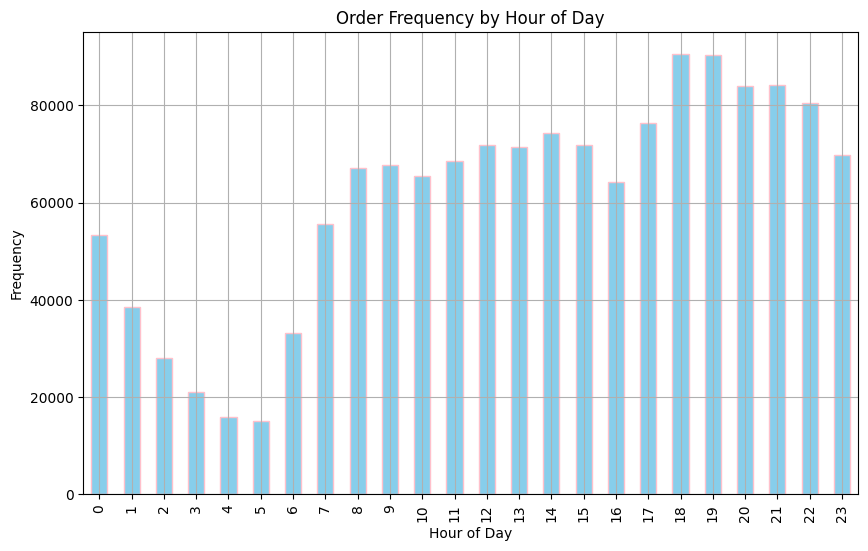

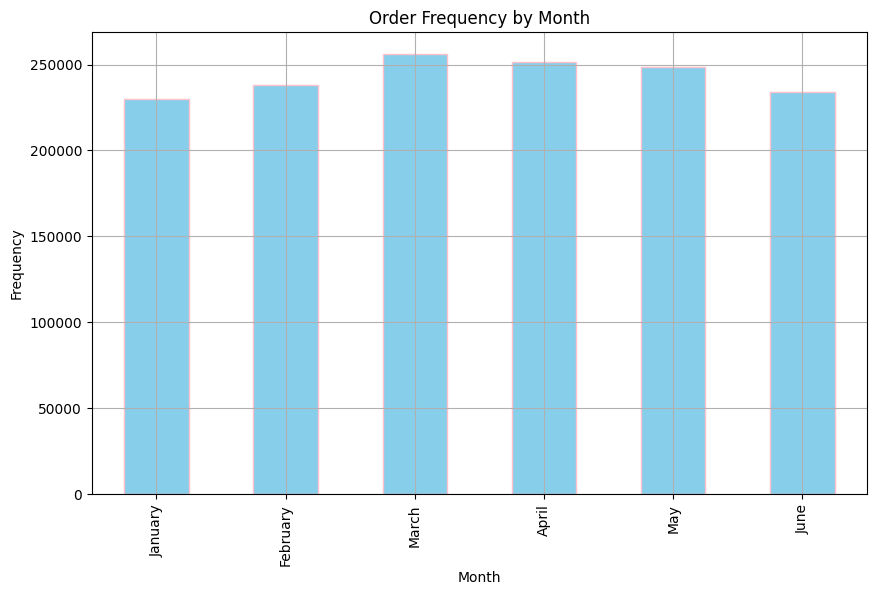

In [18]:
import matplotlib.pyplot as plt
import calendar


# Создать график по дню недели
plt.figure(figsize=(10, 6))
new_df_for_time['day_of_week'].value_counts().sort_index().plot(kind='bar', color='skyblue', edgecolor='pink')
plt.title('Order Frequency by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Frequency')
plt.xticks(range(7), ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
plt.grid(True)
plt.show()

# Создать график по времени
plt.figure(figsize=(10, 6))
new_df_for_time['hour_of_day'].value_counts().sort_index().plot(kind='bar', color='skyblue', edgecolor='pink')
plt.title('Order Frequency by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Создать список меток для оси x
month_labels = [calendar.month_name[month] for month in unique_months[:6]]

# Создать график по месяцам
plt.figure(figsize=(10, 6))
new_df_for_time['month'].value_counts().sort_index().plot(kind='bar', color='skyblue', edgecolor='pink')
plt.title('Order Frequency by Month')
plt.xlabel('Month')
plt.ylabel('Frequency')
plt.xticks(range(6), month_labels)
plt.grid(True)
plt.show()


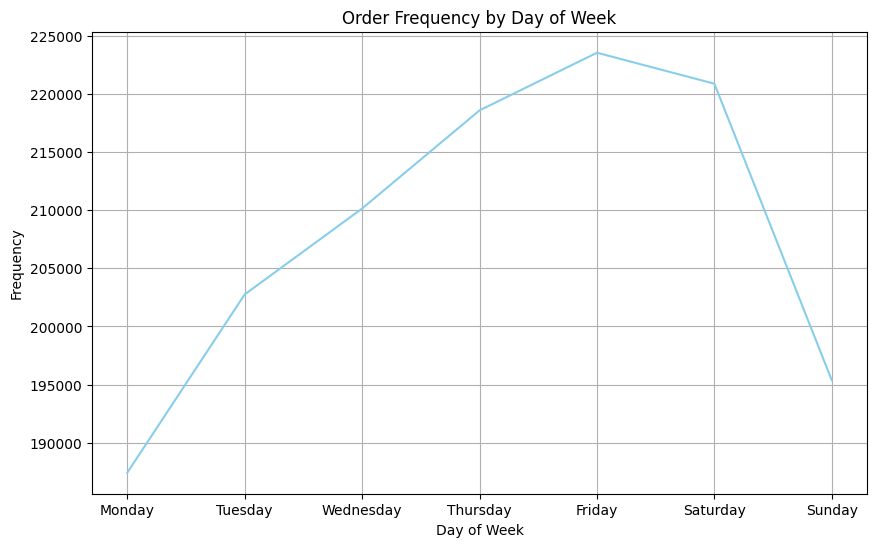

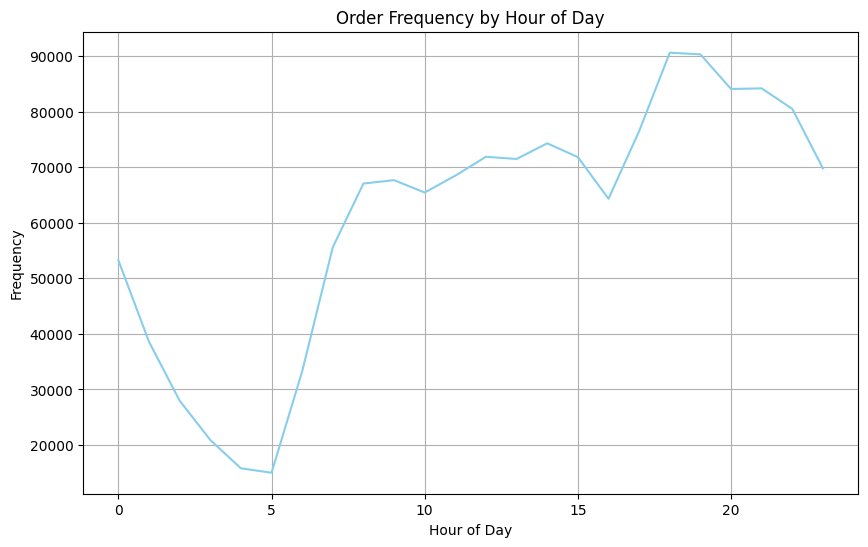

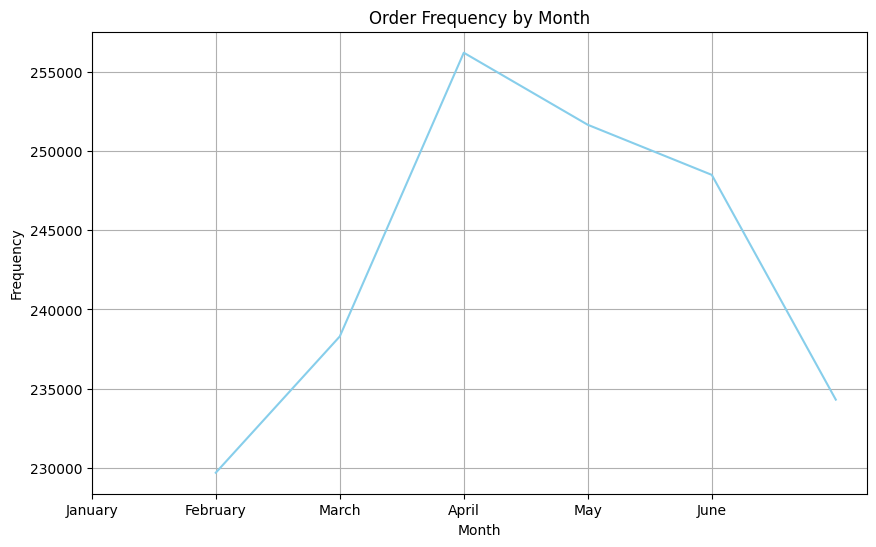

In [19]:
import matplotlib.pyplot as plt
import calendar

# Создать график по дню недели
plt.figure(figsize=(10, 6))
new_df_for_time['day_of_week'].value_counts().sort_index().plot(color='skyblue')
plt.title('Order Frequency by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Frequency')
plt.xticks(range(7), ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
plt.grid(True)
plt.show()

# Создать график по времени
plt.figure(figsize=(10, 6))
new_df_for_time['hour_of_day'].value_counts().sort_index().plot(color='skyblue')
plt.title('Order Frequency by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


month_labels = [calendar.month_name[month] for month in unique_months[:6]]

# Создать график по месяцам
plt.figure(figsize=(10, 6))
new_df_for_time['month'].value_counts().sort_index().plot(color='skyblue')
plt.title('Order Frequency by Month')
plt.xlabel('Month')
plt.ylabel('Frequency')
plt.xticks(range(6), month_labels)
plt.grid(True)
plt.show()


<ipython-input-20-a692fcadf4d4>:10: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=new_df_for_time, x='hour_of_day', y='month', estimator='count', ci=None, hue='month', palette='viridis')


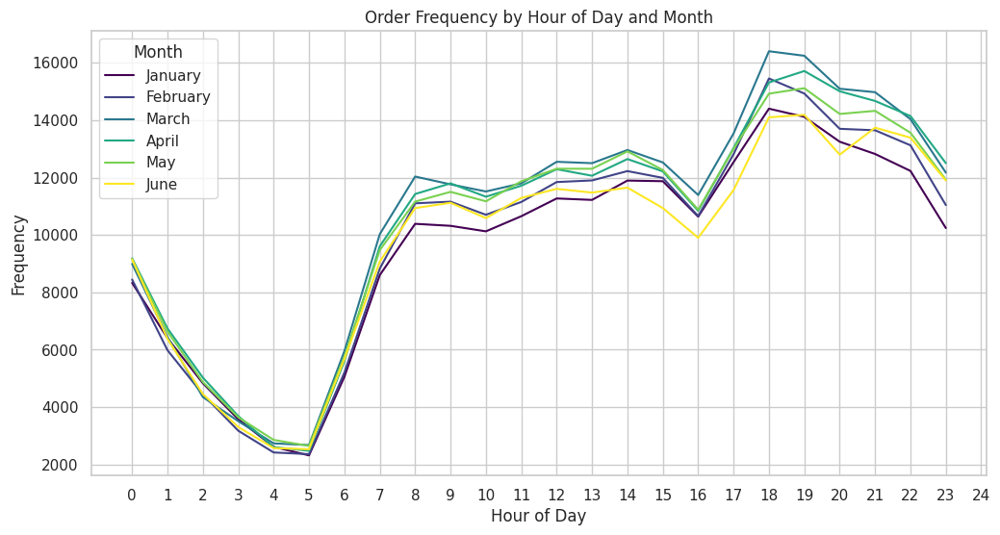

<ipython-input-20-a692fcadf4d4>:21: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=new_df_for_time, x='hour_of_day', y='day_of_week', estimator='count', ci=None, hue='day_of_week', palette='viridis')


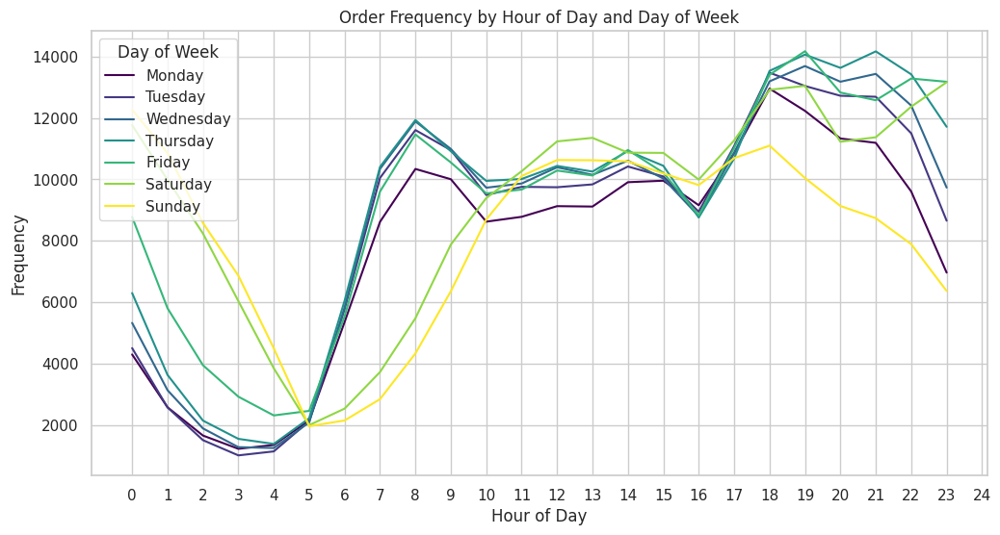

In [20]:

import seaborn as sns
import matplotlib.pyplot as plt
import calendar

# Установка стиля Seaborn
sns.set(style="whitegrid")

# Создание графика по месяцам и часам
plt.figure(figsize=(12, 6))
sns.lineplot(data=new_df_for_time, x='hour_of_day', y='month', estimator='count', ci=None, hue='month', palette='viridis')
plt.title('Order Frequency by Hour of Day and Month')
plt.xlabel('Hour of Day')
plt.ylabel('Frequency')
plt.xticks(range(0, 25))  # Часы от 0 до 24
plt.grid(True)
plt.legend(title='Month', loc='upper left', labels=month_labels[:6])  # Метки только для первых шести месяцев
plt.show()

# Создание графика по дням недели и часам
plt.figure(figsize=(12, 6))
sns.lineplot(data=new_df_for_time, x='hour_of_day', y='day_of_week', estimator='count', ci=None, hue='day_of_week', palette='viridis')
plt.title('Order Frequency by Hour of Day and Day of Week')
plt.xlabel('Hour of Day')
plt.ylabel('Frequency')
plt.xticks(range(0, 25))  # Часы от 0 до 24
plt.grid(True)
plt.legend(title='Day of Week', loc='upper left', labels=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
plt.show()


In [21]:
import folium

# Случайный выбор 10,000 строк из DataFrame
sampled_df = test_df.sample(n=10000, random_state=1)

# Создание базовой карты
latitude = sampled_df['dropoff_latitude'].mean()
longitude = sampled_df['dropoff_longitude'].mean()
map = folium.Map(location=[latitude, longitude], zoom_start=12)

counter=0
# Добавление маркеров на карту
for _, row in sampled_df.iterrows():
    counter+=1
    print(counter)
    folium.Marker([row['dropoff_latitude'], row['dropoff_longitude']]).add_to(map)

# Сохранение карты в файл и отображение
map.save("map.html")
map



Выходные данные были обрезаны до нескольких последних строк (5000).
5001
5002
5003
5004
5005
5006
5007
5008
5009
5010
5011
5012
5013
5014
5015
5016
5017
5018
5019
5020
5021
5022
5023
5024
5025
5026
5027
5028
5029
5030
5031
5032
5033
5034
5035
5036
5037
5038
5039
5040
5041
5042
5043
5044
5045
5046
5047
5048
5049
5050
5051
5052
5053
5054
5055
5056
5057
5058
5059
5060
5061
5062
5063
5064
5065
5066
5067
5068
5069
5070
5071
5072
5073
5074
5075
5076
5077
5078
5079
5080
5081
5082
5083
5084
5085
5086
5087
5088
5089
5090
5091
5092
5093
5094
5095
5096
5097
5098
5099
5100
5101
5102
5103
5104
5105
5106
5107
5108
5109
5110
5111
5112
5113
5114
5115
5116
5117
5118
5119
5120
5121
5122
5123
5124
5125
5126
5127
5128
5129
5130
5131
5132
5133
5134
5135
5136
5137
5138
5139
5140
5141
5142
5143
5144
5145
5146
5147
5148
5149
5150
5151
5152
5153
5154
5155
5156
5157
5158
5159
5160
5161
5162
5163
5164
5165
5166
5167
5168
5169
5170
5171
5172
5173
5174
5175
5176
5177
5178
5179
5180
5181
5182
5183
5184
5185
5186
51

In [22]:
import folium
import pandas as pd

# Создание базовой карты
map = folium.Map(location=[latitude, longitude], zoom_start=12)

# Добавление маркеров и кругов на карту
for _, row in sampled_df.iterrows():
    folium.Marker([row['dropoff_latitude'], row['dropoff_longitude']]).add_to(map)
    folium.Circle(
        location=[row['dropoff_latitude'], row['dropoff_longitude']],
        radius=500,  # Радиус в метрах
        color='blue',
        fill=True,
        fill_color='lightblue'
    ).add_to(map)

# Сохранение карты в файл и отображение
map.save("map.html")
map



#Apply RF, linear regression and GB (xgboost or lightgbm or catboost) algorithms to the data.

In [23]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
import lightgbm as lgb
from sklearn.metrics import mean_squared_error, r2_score


In [24]:

'''
train_df_X_train = X_train
train_df_Y_train = Y_train
train_df_X_test = X_test
train_df_Y_test = Y_test
'''

id_df=train_df_X_train['id']
train_df_X_train = train_df_X_train.drop(columns=['id'])
train_df_X_test = train_df_X_test.drop(columns=['id'])


In [25]:
train_df_X_train

,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag
1053743,2,2016-06-29 18:21:02,1,-73.862762,40.768822,-73.891701,40.746689,N
273748,2,2016-04-25 13:03:26,1,-73.958038,40.783237,-73.975510,40.760853,N
433988,2,2016-05-07 12:36:09,1,-73.969460,40.785519,-73.989243,40.771748,N
1442481,1,2016-05-14 18:44:17,1,-73.981743,40.736549,-73.998352,40.726440,N
1025834,2,2016-04-10 22:51:25,1,-73.977913,40.752609,-73.975647,40.733139,N
...,...,...,...,...,...,...,...,...
259178,2,2016-03-25 07:11:49,2,-73.955032,40.777328,-74.006203,40.749424,N
1414414,1,2016-02-16 18:01:45,1,-73.973618,40.763920,-73.983849,40.749874,N
131932,2,2016-01-26 19:22:29,1,-74.006195,40.734283,-73.949608,40.785282,N
671155,1,2016-01-19 11:53:47,1,-73.962341,40.767323,-73.969757,40.768669,N


In [26]:

# Преобразовать столбец с датой и временем в числовой формат (Unix-время)
train_df_X_train['pickup_datetime'] = pd.to_datetime(train_df_X_train['pickup_datetime']).astype(int)
#train_df_X_train['trip_duration'] = pd.to_datetime(train_df_Y_train['trip_duration']).astype(int)
#train_df_Y_train['dropoff_datetime'] = pd.to_datetime(train_df_Y_train['dropoff_datetime']).astype(int)


train_df_X_test['pickup_datetime'] = pd.to_datetime(train_df_X_test['pickup_datetime']).astype(int)
#train_df_Y_test['trip_duration'] = pd.to_datetime(train_df_Y_test['trip_duration']).astype(int)
#train_df_Y_test['dropoff_datetime'] = pd.to_datetime(train_df_Y_test['dropoff_datetime']).astype(int)




# Получение списка столбцов с категориальными данными
categorical_columns = train_df_X_train.select_dtypes(include=['object']).columns.tolist()
print(categorical_columns)

['store_and_fwd_flag']


In [27]:
train_df_Y_train

1053743    1133
273748      887
433988      686
1442481     818
1025834     951
           ... 
259178     1281
1414414     833
131932     1285
671155      389
121958     1570
Name: trip_duration, Length: 1166915, dtype: int64

In [28]:
unique_values = train_df_X_train['store_and_fwd_flag'].unique()
print(unique_values)

['N' 'Y']


In [29]:
train_df_X_train['store_and_fwd_flag'].nunique()

2

In [30]:
# Создание словаря замены
replace_dict = {'N': 0, 'Y': 1}

# Применение бинарной замены
train_df_X_train['store_and_fwd_flag'] = train_df_X_train['store_and_fwd_flag'].replace(replace_dict)
train_df_X_test['store_and_fwd_flag'] = train_df_X_test['store_and_fwd_flag'].replace(replace_dict)

In [31]:
train_df_X_train

,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag
1053743,2,1467224462000000000,1,-73.862762,40.768822,-73.891701,40.746689,0
273748,2,1461589406000000000,1,-73.958038,40.783237,-73.975510,40.760853,0
433988,2,1462624569000000000,1,-73.969460,40.785519,-73.989243,40.771748,0
1442481,1,1463251457000000000,1,-73.981743,40.736549,-73.998352,40.726440,0
1025834,2,1460328685000000000,1,-73.977913,40.752609,-73.975647,40.733139,0
...,...,...,...,...,...,...,...,...
259178,2,1458889909000000000,2,-73.955032,40.777328,-74.006203,40.749424,0
1414414,1,1455645705000000000,1,-73.973618,40.763920,-73.983849,40.749874,0
131932,2,1453836149000000000,1,-74.006195,40.734283,-73.949608,40.785282,0
671155,1,1453204427000000000,1,-73.962341,40.767323,-73.969757,40.768669,0


#Linear regression

In [32]:
#обучение лин регресии
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Создадим и обучим модель линейной регрессии
lr_model = LinearRegression()
lr_model.fit(train_df_X_train , train_df_Y_train)




LinearRegression()

In [33]:
# Сделаем предсказания на тестовой выборке
Y_pred = lr_model.predict(train_df_X_test)

# Оценим качество модели
mse = mean_squared_error(train_df_Y_test, Y_pred)
print(f"Mean Squared Error: {mse}")

# Если нужно увидеть коэффициенты модели:
print("Coefficients:", lr_model.coef_)
print("Intercept:", lr_model.intercept_)

Mean Squared Error: 10587160.555133944
Coefficients: [ 4.34267364e+00  7.69757527e-15  3.46758034e+01  4.78069393e-03
 -4.00801027e-03 -1.04450461e-03 -2.35803668e-03 -5.00783366e-02]
Intercept: -10339.18874964555


# Random Forest

In [34]:
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
from sklearn.metrics import mean_squared_error


'''
Выключила, ибо не успевалось отработать, а не блокнот с отработанным не сохранила

'''
# Random Forest
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(train_df_X_train , train_df_Y_train)


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-34-03515704647a>", line 12, in <cell line: 12>
    rf_model.fit(train_df_X_train , train_df_Y_train)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py", line 473, in fit
    trees = Parallel(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/parallel.py", line 63, in __call__
    return super().__call__(iterable_with_config)
  File "/usr/local/lib/python3.10/dist-packages/joblib/parallel.py", line 1918, in __call__
    return output if self.return_generator else list(output)
  File "/usr/local/lib/python3.10/dist-packages/joblib/parallel.py", line 1847, in _get_sequential_output
    res = func(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/parallel.py", line 123, in __call__
    return self.function(*ar

TypeError: object of type 'NoneType' has no len()

In [ ]:
Y_pred_rf = rf_model.predict(train_df_X_test)
mse_rf = mean_squared_error(train_df_Y_test, Y_pred_rf)
print(f"Random Forest Mean Squared Error: {mse_rf}")


 # GB

In [35]:
# XGBoost
xgb_model = xgb.XGBRegressor(n_estimators=100, random_state=42)
xgb_model.fit(train_df_X_train , train_df_Y_train)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [36]:
Y_pred_xgb = xgb_model.predict(train_df_X_test)
mse_xgb = mean_squared_error(train_df_Y_test, Y_pred_xgb)
print(f"XGBoost Mean Squared Error: {mse_xgb}")

XGBoost Mean Squared Error: 17499294.066195767


# 4. Try then create at least 5 new features, that improve you result at least on 10%.

In [37]:
#1 - задать день недели как доп параметр
#2 - задать меясц как доп параметр
#3 - задать час, в котором заказали машину как доп параметр
#4 - посчитать расстояние от точки до точки(не по дорогам)
#5 - из графиков выше видно, что пик загруженности по времени с 18 до 21 - ставим доп метку -час-пик





In [38]:
from sklearn.preprocessing import OneHotEncoder

# Извлечение дня недели, месяца и часа
train_df['day_of_week'] = train_df['pickup_datetime'].dt.dayofweek
train_df['month'] = train_df['pickup_datetime'].dt.month
train_df['hour'] = train_df['pickup_datetime'].dt.hour

# Применение One-Hot Encoding к дням недели, месяцам и часам
ohe = OneHotEncoder(sparse=False)

day_of_week_ohe = ohe.fit_transform(train_df[['day_of_week']])
month_ohe = ohe.fit_transform(train_df[['month']])
hour_ohe = ohe.fit_transform(train_df[['hour']])

# Преобразование результатов OHE в DataFrame и добавление их к train_df
day_of_week_df = pd.DataFrame(day_of_week_ohe, columns=[f'day_{i}' for i in range(day_of_week_ohe.shape[1])])
month_df = pd.DataFrame(month_ohe, columns=[f'month_{i+1}' for i in range(month_ohe.shape[1])])
hour_df = pd.DataFrame(hour_ohe, columns=[f'hour_{i}' for i in range(hour_ohe.shape[1])])

# Сброс индексов, чтобы DataFrame можно было соединить
train_df = train_df.reset_index(drop=True)
day_of_week_df = day_of_week_df.reset_index(drop=True)
month_df = month_df.reset_index(drop=True)
hour_df = hour_df.reset_index(drop=True)

# Объединение оригинального DataFrame с новыми OHE DataFrame
train_df = pd.concat([train_df, day_of_week_df, month_df, hour_df], axis=1)

# Удаление временных столбцов
train_df = train_df.drop(['day_of_week', 'month', 'hour'], axis=1)

# Просмотр первых нескольких строк с новыми фичами
print(train_df)

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


                id  vendor_id     pickup_datetime    dropoff_datetime  \
0        id2875421          2 2016-03-14 17:24:55 2016-03-14 17:32:30   
1        id2377394          1 2016-06-12 00:43:35 2016-06-12 00:54:38   
2        id3858529          2 2016-01-19 11:35:24 2016-01-19 12:10:48   
3        id3504673          2 2016-04-06 19:32:31 2016-04-06 19:39:40   
4        id2181028          2 2016-03-26 13:30:55 2016-03-26 13:38:10   
...            ...        ...                 ...                 ...   
1458639  id2376096          2 2016-04-08 13:31:04 2016-04-08 13:44:02   
1458640  id1049543          1 2016-01-10 07:35:15 2016-01-10 07:46:10   
1458641  id2304944          2 2016-04-22 06:57:41 2016-04-22 07:10:25   
1458642  id2714485          1 2016-01-05 15:56:26 2016-01-05 16:02:39   
1458643  id1209952          1 2016-04-05 14:44:25 2016-04-05 14:47:43   

         passenger_count  pickup_longitude  pickup_latitude  \
0                      1        -73.982155        40.767937 

In [39]:
import numpy as np

def haversine(lat1, lon1, lat2, lon2):
    """
    Вычисление расстояния по формуле Haversine
    """
    # Радиус Земли в километрах
    R = 6371.0

    # Преобразование градусов в радианы
    lat1_rad = np.radians(lat1)
    lon1_rad = np.radians(lon1)
    lat2_rad = np.radians(lat2)
    lon2_rad = np.radians(lon2)

    # Разницы координат
    dlat = lat2_rad - lat1_rad
    dlon = lon2_rad - lon1_rad

    # Формула Haversine
    a = np.sin(dlat / 2)**2 + np.cos(lat1_rad) * np.cos(lat2_rad) * np.sin(dlon / 2)**2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))

    distance = R * c
    return distance

# Применение функции к DataFrame
train_df['distance_km'] = haversine(train_df['pickup_latitude'],
                                    train_df['pickup_longitude'],
                                    train_df['dropoff_latitude'],
                                    train_df['dropoff_longitude'])

# Просмотр первых нескольких строк с новой фичей
print(train_df.head())


          id  vendor_id     pickup_datetime    dropoff_datetime  \
0  id2875421          2 2016-03-14 17:24:55 2016-03-14 17:32:30   
1  id2377394          1 2016-06-12 00:43:35 2016-06-12 00:54:38   
2  id3858529          2 2016-01-19 11:35:24 2016-01-19 12:10:48   
3  id3504673          2 2016-04-06 19:32:31 2016-04-06 19:39:40   
4  id2181028          2 2016-03-26 13:30:55 2016-03-26 13:38:10   

   passenger_count  pickup_longitude  pickup_latitude  dropoff_longitude  \
0                1        -73.982155        40.767937         -73.964630   
1                1        -73.980415        40.738564         -73.999481   
2                1        -73.979027        40.763939         -74.005333   
3                1        -74.010040        40.719971         -74.012268   
4                1        -73.973053        40.793209         -73.972923   

   dropoff_latitude store_and_fwd_flag  ...  hour_15  hour_16  hour_17  \
0         40.765602                  N  ...      0.0      0.0     

In [40]:
train_df['pickup_datetime'] = pd.to_datetime(train_df['pickup_datetime'])

# Добавьте столбец с меткой "час пик"
train_df['is_peak_hour'] = (train_df['pickup_datetime'].dt.hour >= 18) & (train_df['pickup_datetime'].dt.hour < 22)

train_df['is_peak_hour'] = train_df['is_peak_hour'].astype(int)

In [41]:
train_df

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,...,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23,distance_km,is_peak_hour
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.498521,0
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.805507,0
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.385098,0
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.485498,1
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.188588,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1458639,id2376096,2,2016-04-08 13:31:04,2016-04-08 13:44:02,4,-73.982201,40.745522,-73.994911,40.740170,N,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.225080,0
1458640,id1049543,1,2016-01-10 07:35:15,2016-01-10 07:46:10,1,-74.000946,40.747379,-73.970184,40.796547,N,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.049836,0
1458641,id2304944,2,2016-04-22 06:57:41,2016-04-22 07:10:25,1,-73.959129,40.768799,-74.004433,40.707371,N,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.824606,0
1458642,id2714485,1,2016-01-05 15:56:26,2016-01-05 16:02:39,1,-73.982079,40.749062,-73.974632,40.757107,N,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.092564,0


#Training LR

In [42]:
train_df['store_and_fwd_flag'] = train_df['store_and_fwd_flag'].replace(replace_dict)
X_new = train_df.drop(columns=['dropoff_datetime', 'trip_duration','id'])
X_new['pickup_datetime'] = pd.to_datetime(train_df['pickup_datetime']).astype(int)
Y_new= train_df['trip_duration']

# Разделение на обучающий и тестовый наборы данных
X_train_new, X_test_new, Y_train_new, Y_test_new = train_test_split(X_new, Y_new, test_size=0.2, random_state=42)


In [43]:
# Создадим и обучим модель линейной регрессии
lr_model = LinearRegression()
lr_model.fit(X_train_new , Y_train_new)


LinearRegression()

In [44]:
# Сделаем предсказания на тестовой выборке
Y_pred = lr_model.predict(X_test_new)

# Оценим качество модели
mse = mean_squared_error(Y_test_new, Y_pred)
print(f"Mean Squared Error: {mse}")

# Если нужно увидеть коэффициенты модели:
print("Coefficients:", lr_model.coef_)
print("Intercept:", lr_model.intercept_)

Mean Squared Error: 10327908.759023428
Coefficients: [ 3.91153017e+00  5.96017752e-15  3.07439971e+01  3.99028336e-01
 -1.98741003e-01  2.37981090e-01 -1.77771483e-01  1.20450690e+00
 -1.51181357e-01 -4.32337318e-01 -2.43730361e-01 -2.08860590e-01
  3.98389192e-03  5.34244885e-01  4.97880849e-01  5.53678148e-02
 -9.72548091e-02 -6.91735346e-02  1.17885867e-01  5.88861851e-02
 -6.57115230e-02  1.54210935e-01  1.95548837e-01  2.61775288e-01
  2.88758163e-01  2.68726411e-01  2.42287677e-01  1.42453905e-01
 -1.92335915e-01 -3.38391967e-01 -3.95473142e-01 -3.41640541e-01
 -2.54362717e-01 -2.05530994e-01  1.06459081e-01  2.27284792e-01
  2.32979095e-01  7.68371286e-02 -1.70848540e-01 -3.15364182e-01
 -2.16098583e-01 -8.06730091e-02  3.65482095e-02  6.89881661e-02
  2.07861901e-01  1.13316153e+02 -5.75587565e-01]
Intercept: -8123.998924785769


#GB

In [55]:
xgb_model_new = xgb.XGBRegressor(n_estimators=100, random_state=42)
#print(X_train_new.columns.tolist())
#print(X_test_new.columns.tolist())
xgb_model_new.fit(X_train_new , Y_train_new)


['vendor_id', 'pickup_datetime', 'passenger_count', 'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'store_and_fwd_flag', 'day_0', 'day_1', 'day_2', 'day_3', 'day_4', 'day_5', 'day_6', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'hour_0', 'hour_1', 'hour_2', 'hour_3', 'hour_4', 'hour_5', 'hour_6', 'hour_7', 'hour_8', 'hour_9', 'hour_10', 'hour_11', 'hour_12', 'hour_13', 'hour_14', 'hour_15', 'hour_16', 'hour_17', 'hour_18', 'hour_19', 'hour_20', 'hour_21', 'hour_22', 'hour_23', 'distance_km', 'is_peak_hour']
['vendor_id', 'pickup_datetime', 'passenger_count', 'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'store_and_fwd_flag', 'day_0', 'day_1', 'day_2', 'day_3', 'day_4', 'day_5', 'day_6', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'hour_0', 'hour_1', 'hour_2', 'hour_3', 'hour_4', 'hour_5', 'hour_6', 'hour_7', 'hour_8', 'hour_9', 'hour_10', 'hour_11', 'hour_12', 'hour_13', 'hour

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [50]:
X_train_new

,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,day_0,day_1,...,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23,distance_km,is_peak_hour
1053743,2,1467224462000000000,1,-73.862762,40.768822,-73.891701,40.746689,0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,3.463778,1
273748,2,1461589406000000000,1,-73.958038,40.783237,-73.975510,40.760853,0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.891365,0
433988,2,1462624569000000000,1,-73.969460,40.785519,-73.989243,40.771748,0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.262636,0
1442481,1,1463251457000000000,1,-73.981743,40.736549,-73.998352,40.726440,0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.795030,1
1025834,2,1460328685000000000,1,-73.977913,40.752609,-73.975647,40.733139,0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2.173389,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259178,2,1458889909000000000,2,-73.955032,40.777328,-74.006203,40.749424,0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.310383,0
1414414,1,1455645705000000000,1,-73.973618,40.763920,-73.983849,40.749874,0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.783777,1
131932,2,1453836149000000000,1,-74.006195,40.734283,-73.949608,40.785282,0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,7.407646,1
671155,1,1453204427000000000,1,-73.962341,40.767323,-73.969757,40.768669,0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.642215,0


#Ниже баг, т.к. для Лин регрессии были те же самые данные!
#А так я проверила руками, столбцы совпадают и в train, и в test!

In [57]:
#print(X_train_new.columns.tolist()==X_test_new.columns.tolist())
Y_pred_xgb_new = xgb_model.predict(X_test_new)
mse_xgb_new = mean_squared_error(Y_test_new, Y_pred_xgb_new)
print(f"XGBoost Mean Squared Error: {mse_xgb_new}")

True


ValueError: feature_names mismatch: ['vendor_id', 'pickup_datetime', 'passenger_count', 'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'store_and_fwd_flag'] ['vendor_id', 'pickup_datetime', 'passenger_count', 'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'store_and_fwd_flag', 'day_0', 'day_1', 'day_2', 'day_3', 'day_4', 'day_5', 'day_6', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'hour_0', 'hour_1', 'hour_2', 'hour_3', 'hour_4', 'hour_5', 'hour_6', 'hour_7', 'hour_8', 'hour_9', 'hour_10', 'hour_11', 'hour_12', 'hour_13', 'hour_14', 'hour_15', 'hour_16', 'hour_17', 'hour_18', 'hour_19', 'hour_20', 'hour_21', 'hour_22', 'hour_23', 'distance_km', 'is_peak_hour']
training data did not have the following fields: hour_13, day_0, hour_11, hour_17, day_5, month_2, hour_21, hour_7, month_5, hour_22, hour_23, month_1, hour_12, hour_6, month_3, hour_20, day_3, hour_10, hour_2, hour_0, hour_3, is_peak_hour, day_6, hour_5, day_1, hour_14, month_6, hour_16, day_4, hour_8, hour_15, hour_1, hour_19, hour_4, distance_km, hour_9, hour_18, month_4, day_2

In [48]:
print(X_test_new.columns.tolist())
print(X_train_new.columns.tolist())
for i in range(len(X_test_new.columns.tolist())):
  if X_test_new.columns.tolist()[i]==X_train_new.columns.tolist()[i]:
    print("OK")
  else:
    print(X_test_new.columns.tolist()[i],X_train_new.columns.tolist()[i])


['vendor_id', 'pickup_datetime', 'passenger_count', 'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'store_and_fwd_flag', 'day_0', 'day_1', 'day_2', 'day_3', 'day_4', 'day_5', 'day_6', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'hour_0', 'hour_1', 'hour_2', 'hour_3', 'hour_4', 'hour_5', 'hour_6', 'hour_7', 'hour_8', 'hour_9', 'hour_10', 'hour_11', 'hour_12', 'hour_13', 'hour_14', 'hour_15', 'hour_16', 'hour_17', 'hour_18', 'hour_19', 'hour_20', 'hour_21', 'hour_22', 'hour_23', 'distance_km', 'is_peak_hour']
['vendor_id', 'pickup_datetime', 'passenger_count', 'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'store_and_fwd_flag', 'day_0', 'day_1', 'day_2', 'day_3', 'day_4', 'day_5', 'day_6', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'hour_0', 'hour_1', 'hour_2', 'hour_3', 'hour_4', 'hour_5', 'hour_6', 'hour_7', 'hour_8', 'hour_9', 'hour_10', 'hour_11', 'hour_12', 'hour_13', 'hour